# Отчёт 1. Градиентный спуск и стратегии выбора шага

Сравнение стратегий градиентного спуска на функциях Эккли, Бута, Eggcrate, Plateau, Rastrigin и конечном приближении функции Вейерштрасса.

> **Воспроизводимость.** Ноутбук сохранён как аналитический отчёт с встроенными графиками. В исходном файле вычислительные ячейки не содержали реализации, поэтому полный пересчёт результатов требует исходного кода экспериментов.

[Описание, результаты и инструкция по запуску](../docs/01-gradient-descent.md)


# БАЗОВАЯ ЧАСТЬ

In [ ]:
# импорты


## Функция Эккли

$$
f(x, y) = 20 + e - 20 \exp\left(-0.2 \sqrt{\frac{x^2 + y^2}{2}}\right) - \exp\left(\frac{\cos(2\pi x) + \cos(2\pi y)}{2}\right)
$$

Глобальный минимум достигается в точке $(0, 0)$: $f(0, 0) = 20 + e - 20 \cdot e^{0} - e^{1} = 20 + e - 20 - e = 0$

In [ ]:
# функция Эккли

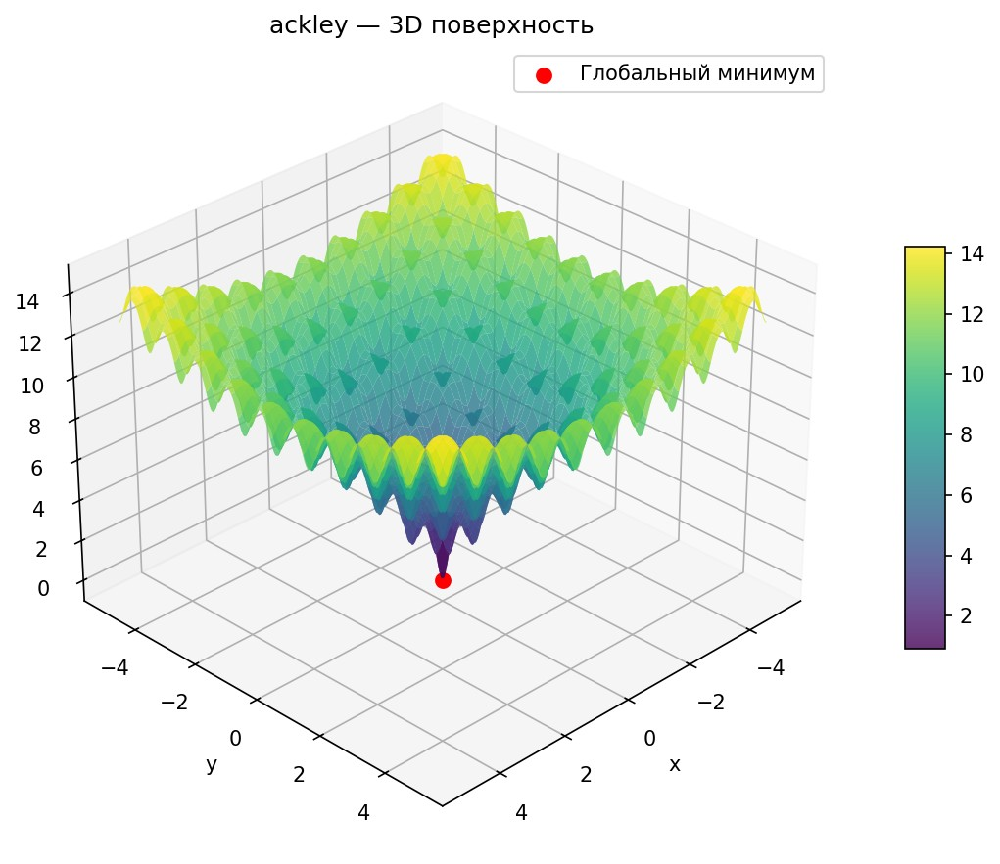
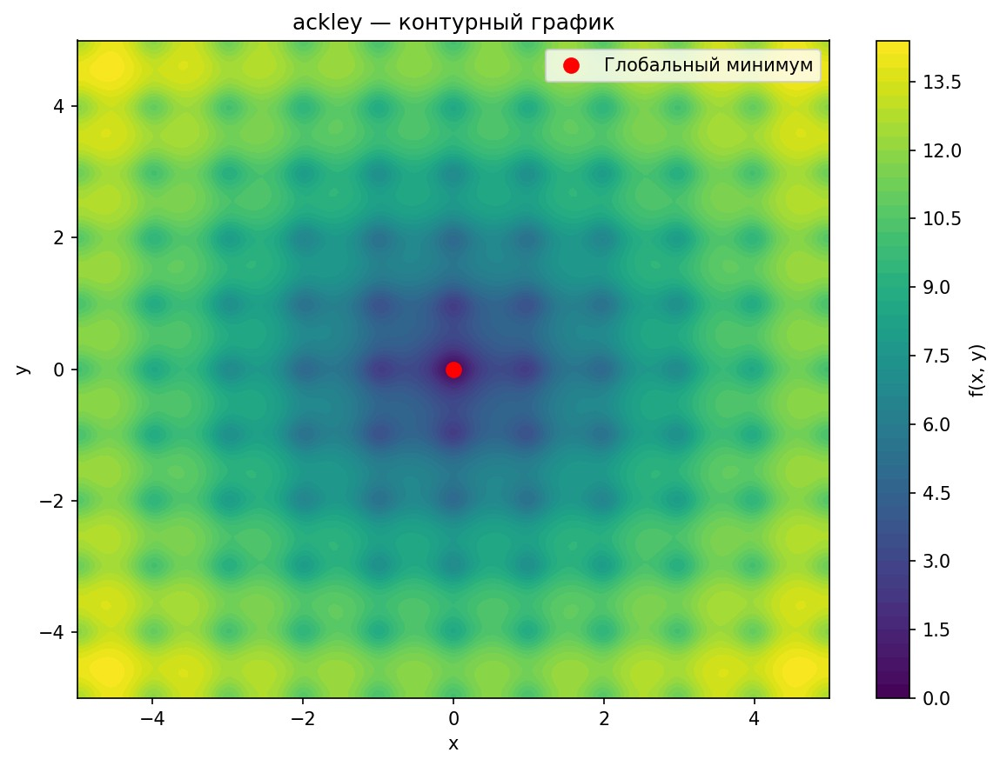



# Функция Бута

$$
f(x, y) = (x + 2y - 7)^2 + (2x + y - 5)^2
$$

Глобальный минимум находится в точке, где оба квадрата обращаются в ноль, то есть решением системы:

$$
\begin{cases}
x + 2y = 7 \\
2x + y = 5
\end{cases}
$$

Решая систему, получаем $x = 1$, $y = 3$. Значение функции в этой точке:

$$
f(1, 3) = (1 + 2\cdot 3 - 7)^2 + (2\cdot 1 + 3 - 5)^2 = 0^2 + 0^2 = 0
$$

In [ ]:
# функция Бута

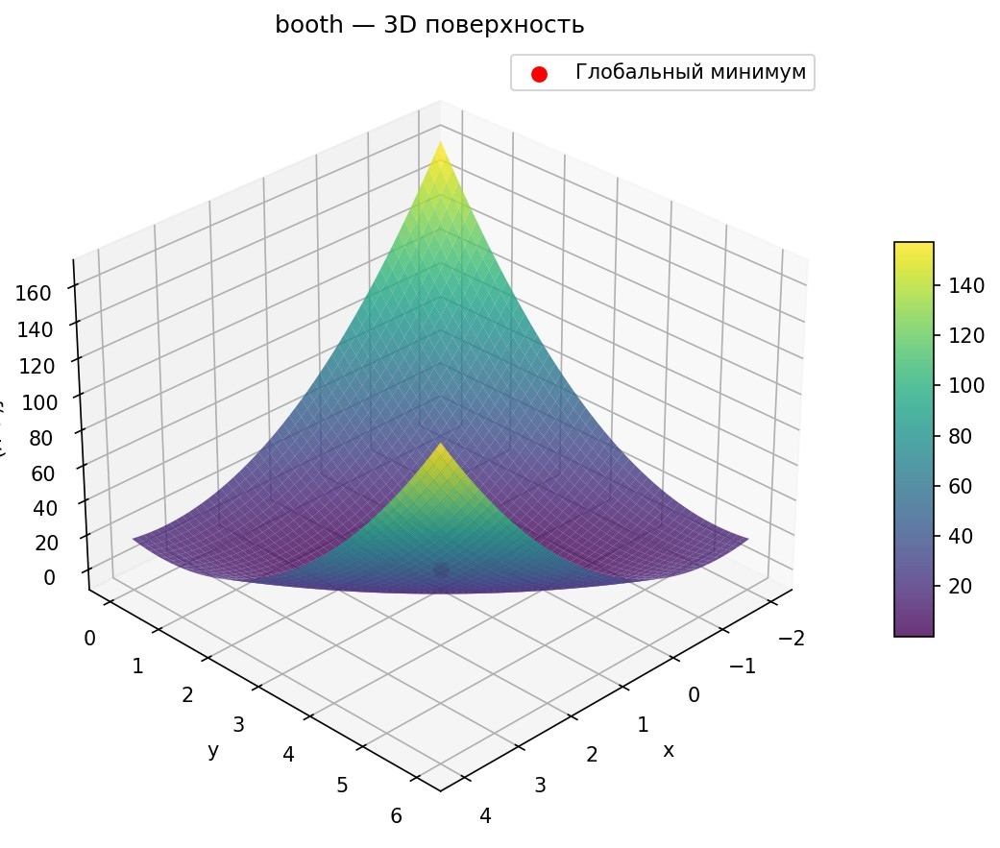
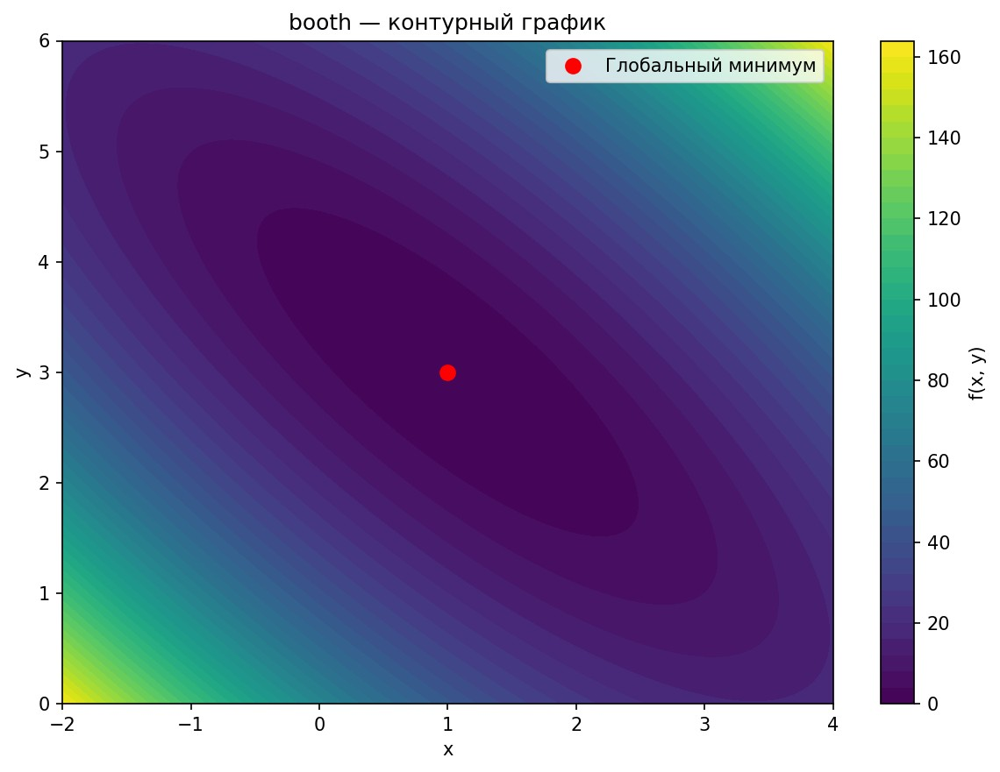

## Функция "Ящик для яиц"

$$
f(x, y) = x^2 + y^2 + 25 \left( \sin^2(x) + \sin^2(y) \right)
$$

Глобальный минимум достигается в точке $(0, 0)$:

$$
f(0, 0) = 0^2 + 0^2 + 25 \left( \sin^2(0) + \sin^2(0) \right) = 0
$$

In [ ]:
# функция ящик для яиц 

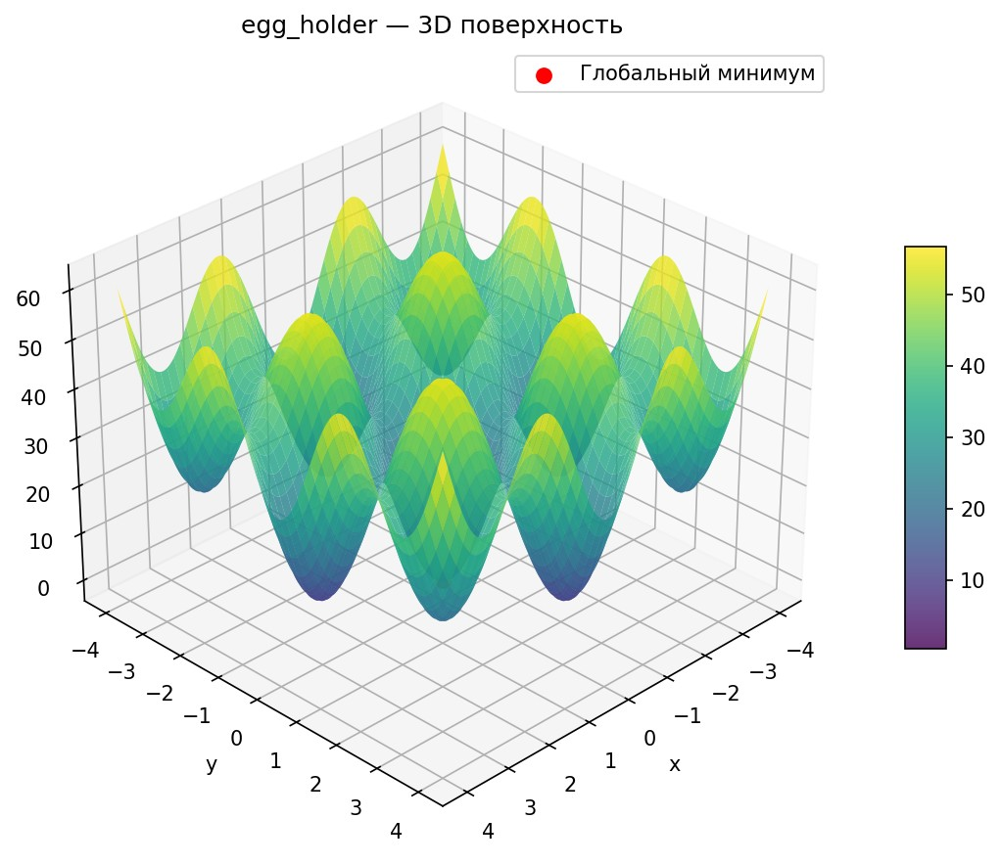
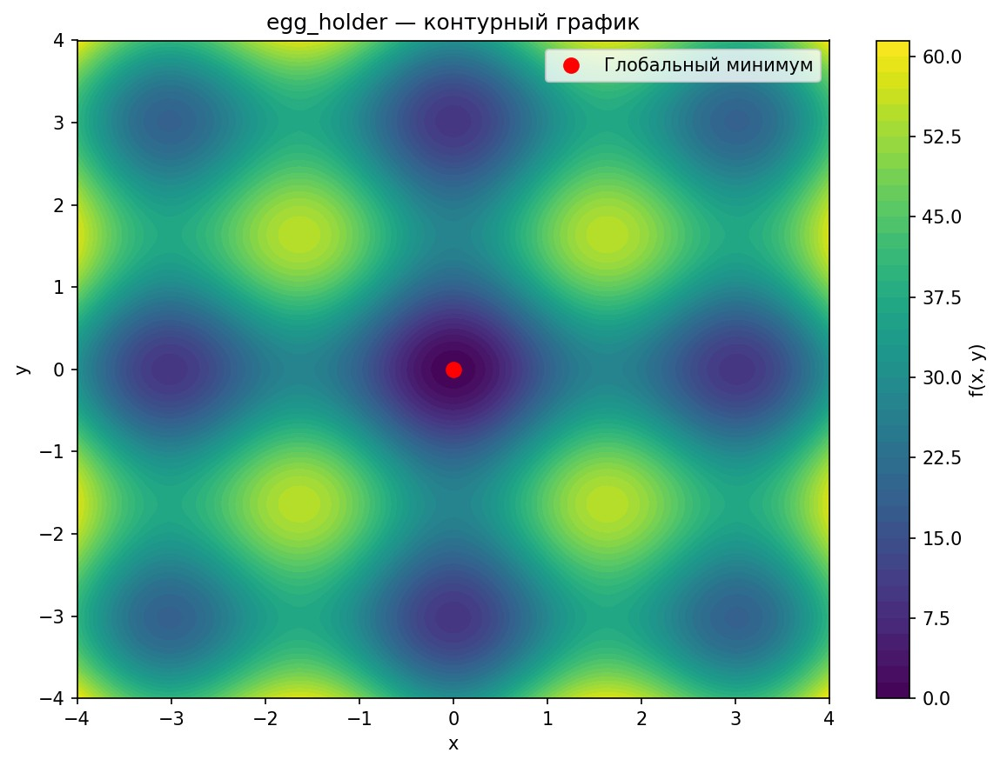

Теперь после того, как мы определили все функции, посчитали аналитически точки минимума, написали код для вычисления функции и её градиента, можно перейти к реализации функции градиентного спуска. 

# Градиентный спуск
Наша функция будет принимать функцию, её производную, стратегию изменения $\lambda$, условия выхода из цикла и максимальное количество итераций.

## Передаваемые функции

### step_strategy(k, x, f_val, grad)

$k$ – номер текущей итерации (начиная с 0).

$x$ – текущая точка (вектор).

$f_{val}$ – значение функции в текущей точке.

$grad$ – градиент в текущей точке (вектор).

### stop_policy(k, x_new, f_new, grad_new, x_old, f_old)

$k$ – номер текущей итерации.

$x_{new}$ – новая точка после шага (вектор).

$f_{new}$ – значение функции в новой точке.

$grad_{new}$ – градиент в новой точке.

$x_{old}$ – предыдущая точка (вектор).

$f_{old}$ – значение функции в предыдущей точке.

In [ ]:
# градиентный спуск

Приведём несколько реализаций стратегии изменения шага и несколько стратегий выхода из цикла

# Стратегия выбора шага
1) Экспоненциальное затухание $\alpha * \lambda ^ {K}$
2) Медленное затухание $\alpha_k = \frac{\alpha_0}{1 + \gamma \cdot k}$
3) Адаптивный выбор шага - если функция уменьшилась то, шаг увеличивается на заданный множитель, если функция выросла или не изменилась, шаг уменьшается, его особенность в том, что он учитывает предыдущее состояние

In [ ]:
# стратегии выбора шага

# Стратегия остановки
1) По малому градиенту
2) По малому значению функции
3) По малому значению аргумента
4) По первым 3 пунктам в совокупности

In [ ]:
# стратегии остановки

# Анализ функции Бута
Пожалуй, самая простая функция из первых трёх:

Градиент аналитический и довольно простой, также функция выпукла, хорошо обусловлена и имеет единственный экстремум.

Для анализа были выбраны точки $[0.7, 1.4] , [4.2, 5.8] , [-2.5, 3.9]$.

В каждой из этих точек каждый выбранный метод довольно быстро сошёлся к минимуму, тут проблем не возникло, функция оказалась хорошей. Каждому способу понадобилось не более 50 итераций.

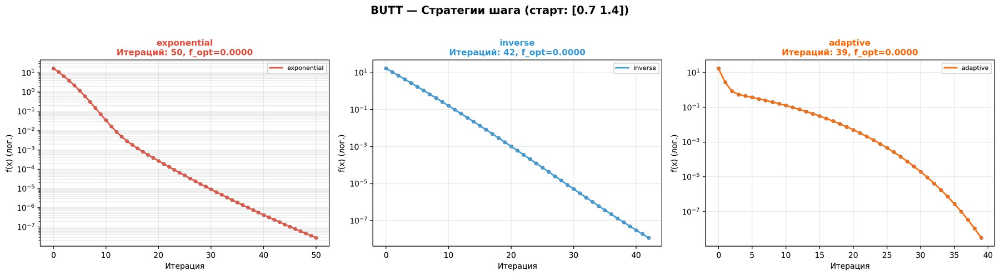
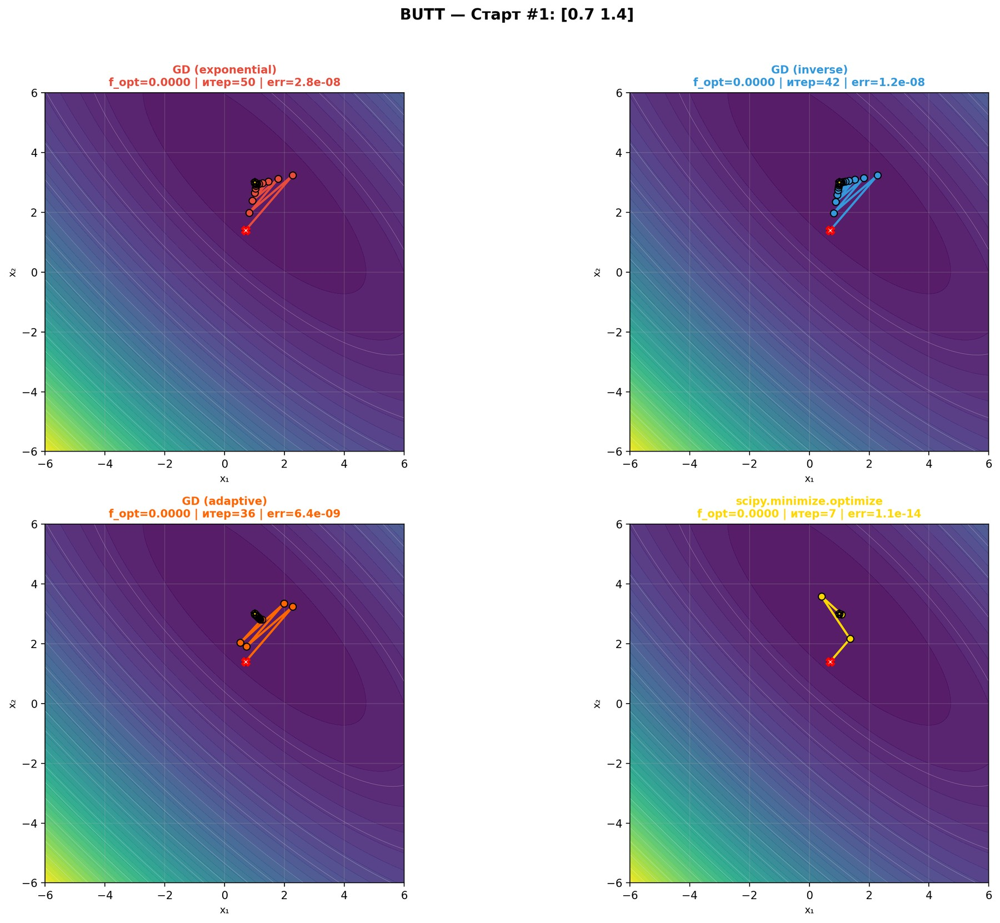
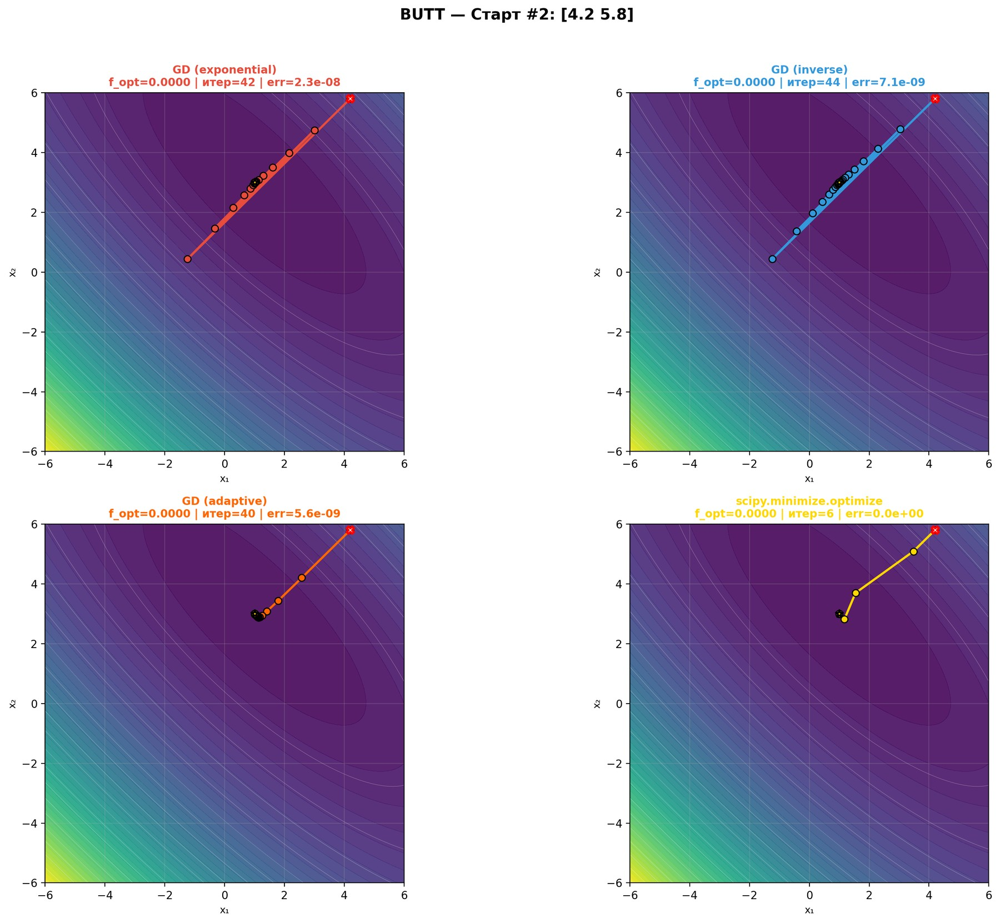
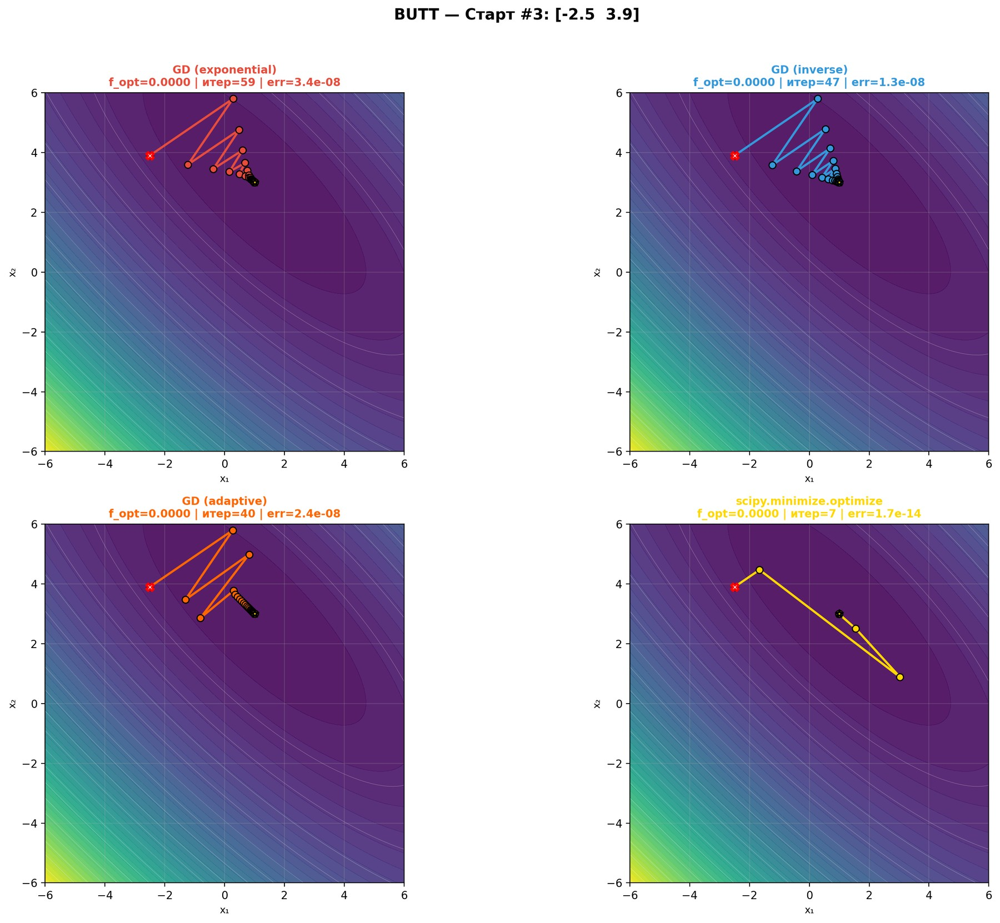

# Анализ функции "Ящик для яиц"
Это уже очень интересная функция, потому что она невыпуклая, у неё много локальных минимумов (мультимодальная), что чревато застреванием в них при маленьком шаге. 

А ещё результат очень зависит от выбора начальной точки. Если неудачно выбрать точку, то можно уехать вообще в противоположном направлении, нужно просто попасть рядом с локальным экстремумом в начале вычислений, при довольно большом начальном шаге. На графике видно, что даже библиотечная в 2 случаях из 3 застревает в локальном экстремуме и не может оттуда выбраться. Также очень важна политика корректировки шага. Как видно, способ, называемый мной inverse имеет очень маленькую корректировку шага, это почти константа, каждый следующий результат почти рандомно летает по всей 6-окрестности минимума (квадрат 6 на 6 вокруг минимума) и почти никаких шансов не имеет попасть в цель. А метод, названный мной adaptive очень хорошо справляется с попаданием в экстремум за несколько шагов, но проблема в том, что экстремум локальный, а метод понятия об этом не имеет и залезает в него. Вывод можно сделать следующий - выбор метода (из приведённых) не особо важен, главное начальная точка, однако лучше всего себя показывает метод с экспоненциальным убыванием шага, он позволяет перепрыгивать маленькие ямы и в них не застревать, с довольно большим шансом выходя на глобальный минимум. Как видно из графика, наступает момент, когда путь начинает дёргаться вокруг минимума по одной прямой взад-вперёд и не отклоняться в другие стороны, уменьшая со временем шаг.

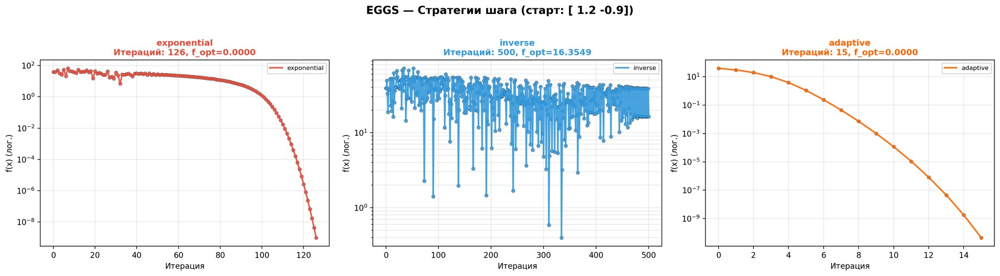
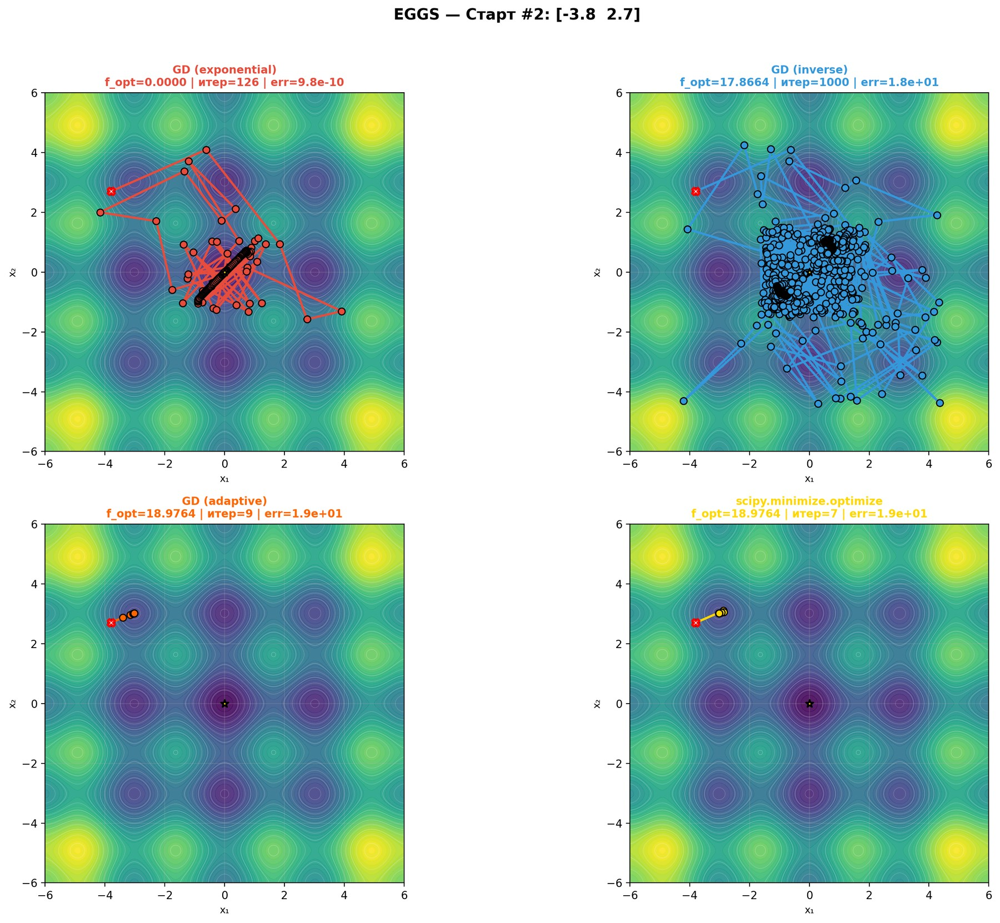
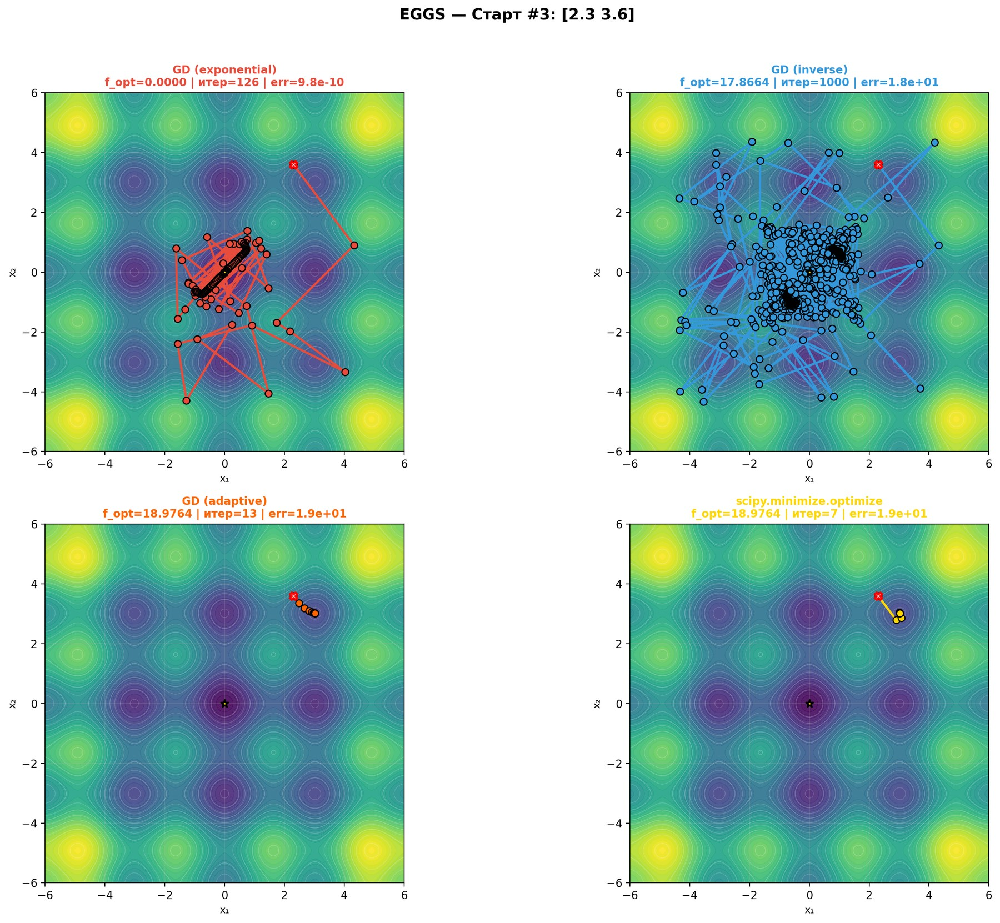
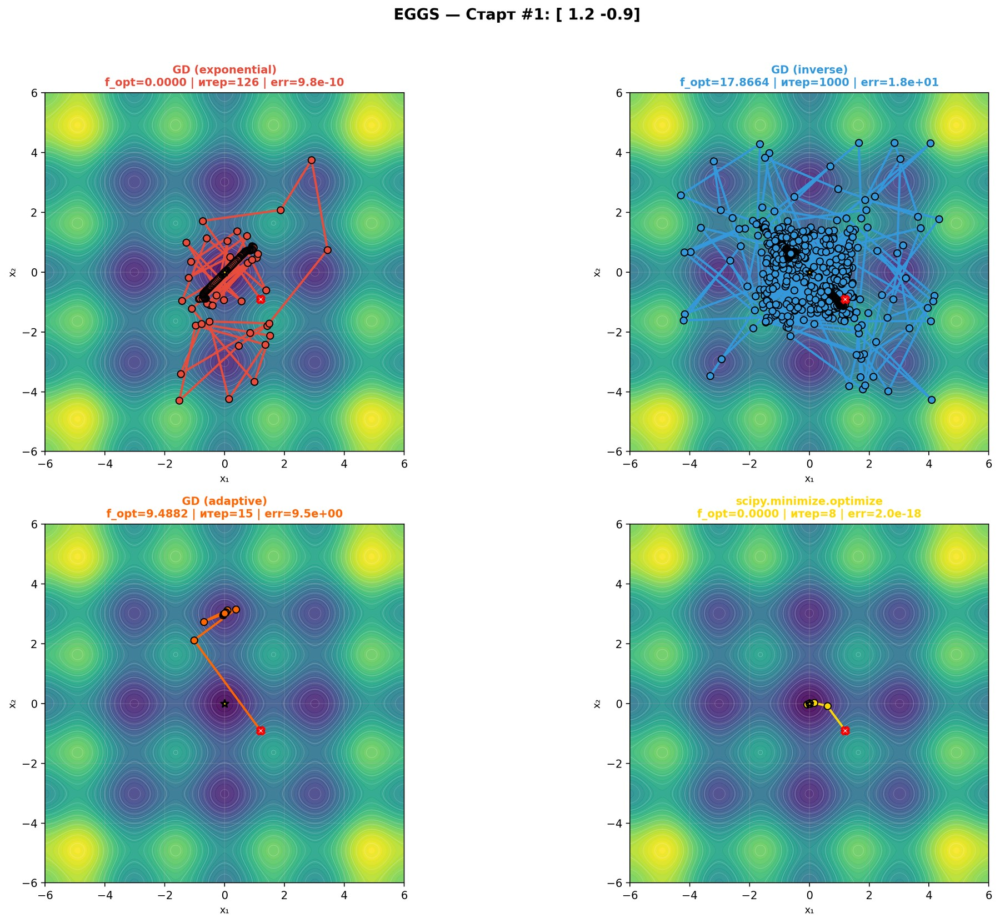

# Анализ двумерной функции Эккли

Вот это пожалуй самая непробиваемая функция из первых 3-х. По рельефу на графиках сверху она выглядит как предыдущая, но в этом случае уход внутрь воронки очень резкий, поэтому любой наш градиентный метод застревает в какой-то из этих воронок, которых вокруг глобального минимума очень много. Только в первом случае экспоненциальный метод смог приблизиться к минимуму, но смотря на его точность в других двух функциях при сильно меньшем количестве итераций, можно сделать вывод, что во-первых в этот раз и этот метод попал не туда, во-вторых он не сошёлся к какой-то точке, хоть и оказался в результате довольно близко к минимуму. Вывод - при очень удачном выборе точки есть шанс попасть в минимум, иначе любой метод застревает в локальном минимуме, либо не сходится.

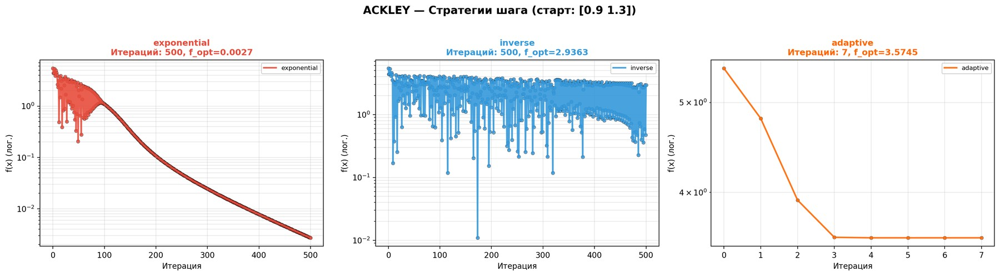
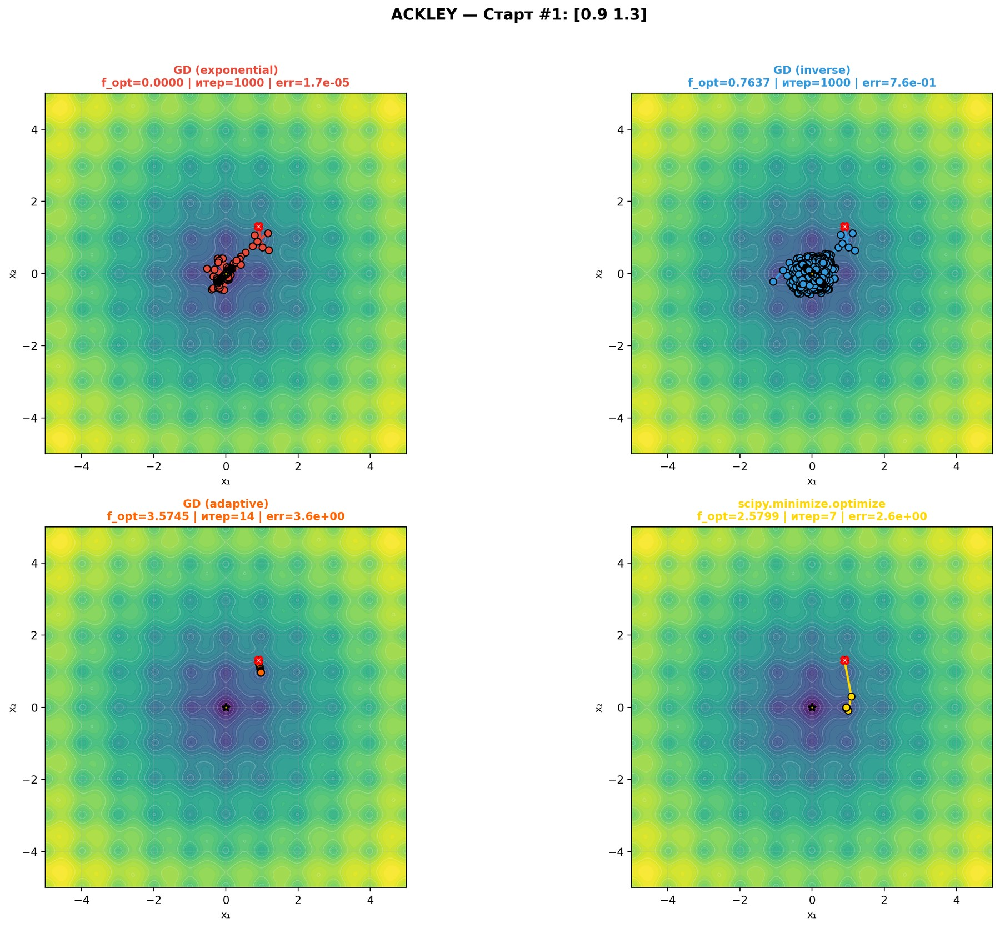
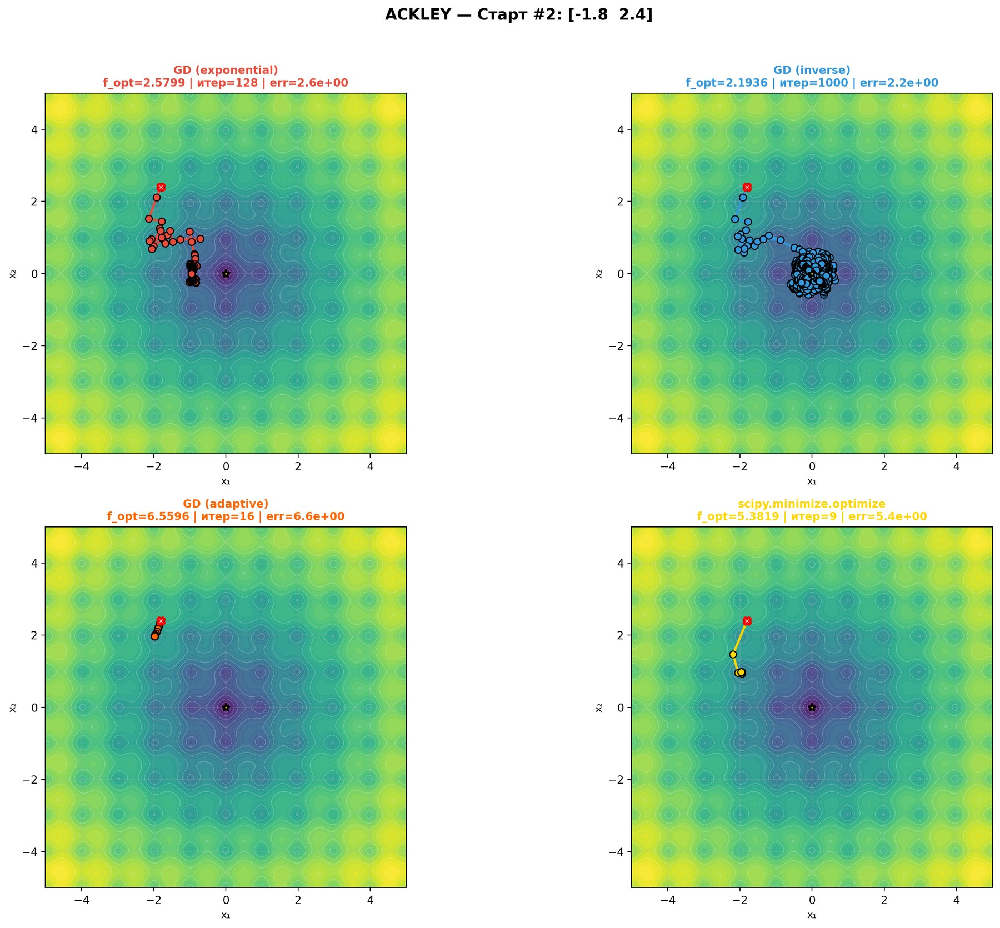
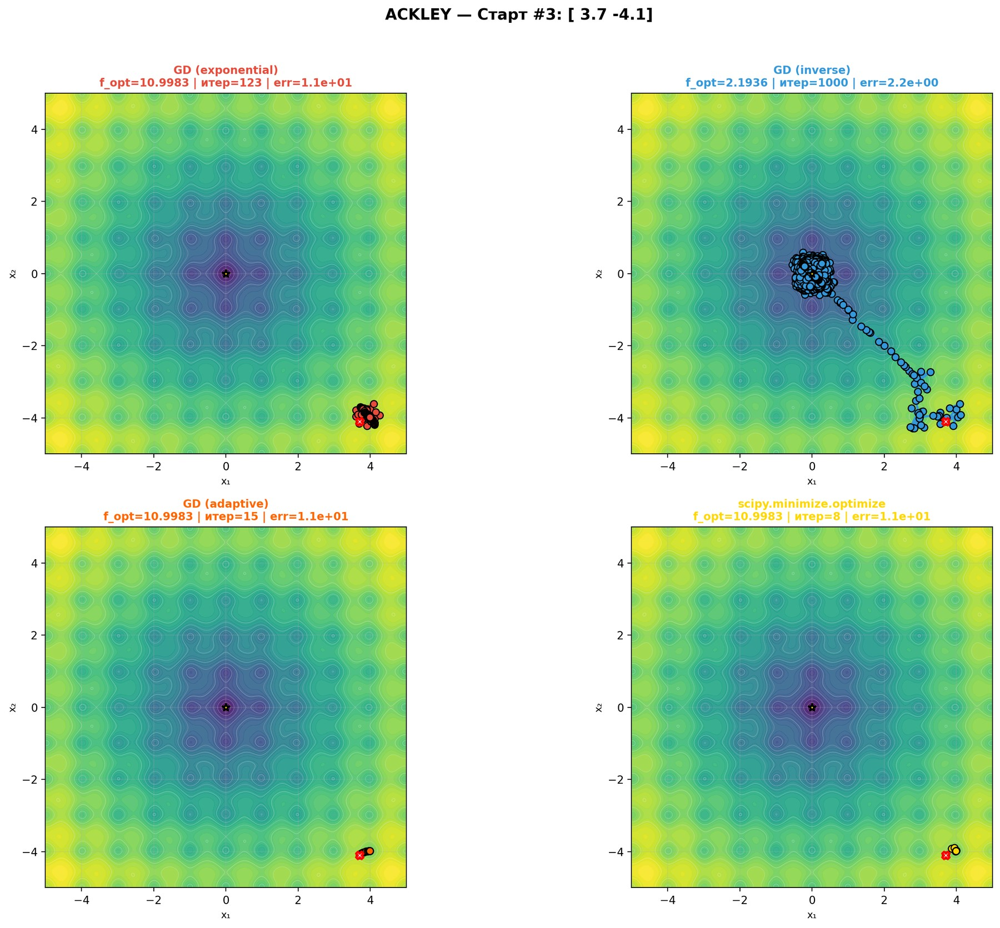

# Вывод
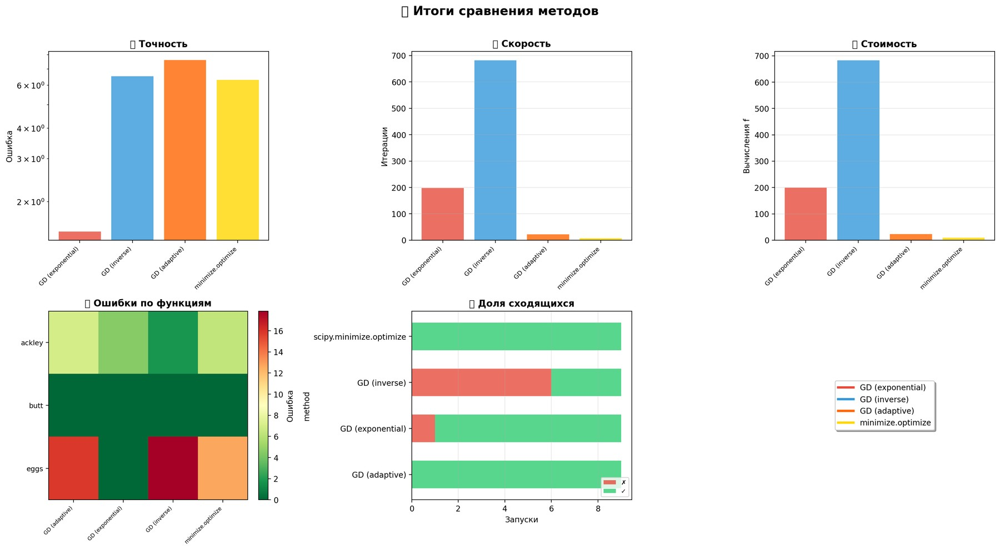

### Точность:
exponential-метод показал наилучшую точность среди других
Стратегии adaptive и inverse демонстрировали высокую ошибку (6-7 единиц) из-за того, что adaptive сходся быстро, а inverse чаще не сходился вообще.
Библиотечный метод minimize показал результаты, сильно зависящие от начальной точки

### Скорость сходимости:
adaptive и minimize наиболее быстрые (10-30 итераций в среднем)
exponential требует в больше итераций (около 200), но обеспечивает более надёжную сходимость.
inverse крайне медленный (до 700 итераций) и часто не достигает сходимости.

### Вычислительная стоимость:
Полностью коррелирует с количеством итераций, никаких сложных встроенных функций, манипуляций с памятью, предвычислений не происходит.
adaptive и minimize наиболее экономичны, потому что тратят мало итераций
inverse наименее эффективна из-за большого числа вычислений функции и градиента

### Сходимость:
minimize и adaptive сходятся всегда из-за того, что быстро уменьшается шаг.
exponential показывает высокую надёжность во всех случаях кроме одного сошёлся.
inverse на мультимодальных функциях работал очень плохо и не сошёлся ни разу

# РАСШИРЕННОЕ ЗАДАНИЕ

В этом разделе будет ещё интереснее! Наши 3 функции (будут двумерные, потому что очень хочется картинки!)
### Плато
$$
f(x, y) = x^4 + y^4 + \varepsilon \exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right)
$$

Градиент которой:
$$
\begin{aligned}
\frac{\partial f}{\partial x} &= 4x^3 - \varepsilon \frac{x}{\sigma^2} \exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right),\\[4pt]
\frac{\partial f}{\partial y} &= 4y^3 - \varepsilon \frac{y}{\sigma^2} \exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right).
\end{aligned}
$$

### Функция Растригина
$$
f(x, y) = 20 + \left(x^2 - 10\cos(2\pi x)\right) + \left(y^2 - 10\cos(2\pi y)\right)
$$

Градиент которой:
$$
\begin{aligned}
\frac{\partial f}{\partial x} &= 2x + 20\pi \sin(2\pi x),\\[4pt]
\frac{\partial f}{\partial y} &= 2y + 20\pi \sin(2\pi y).
\end{aligned}
$$

### Функция Вейерштрасса
$$
f(x, y) = \sum_{k=0}^{20} 0.5^k \cos\Bigl(2\pi \cdot 3^k (x + 0.5)\Bigr) + \sum_{k=0}^{20} 0.5^k \cos\Bigl(2\pi \cdot 3^k (y + 0.5)\Bigr).
$$

Градиент которой, в идеале не существует ни в какой точке, однако у нас приближение, поэтому 

$$
\begin{aligned}
\frac{\partial f}{\partial x} &= -2\pi \sum_{k=0}^{20} (1.5)^k \sin\Bigl(2\pi \cdot 3^k (x + 0.5)\Bigr),\\[4pt]
\frac{\partial f}{\partial y} &= -2\pi \sum_{k=0}^{20} (1.5)^k \sin\Bigl(2\pi \cdot 3^k (y + 0.5)\Bigr).
\end{aligned}
$$

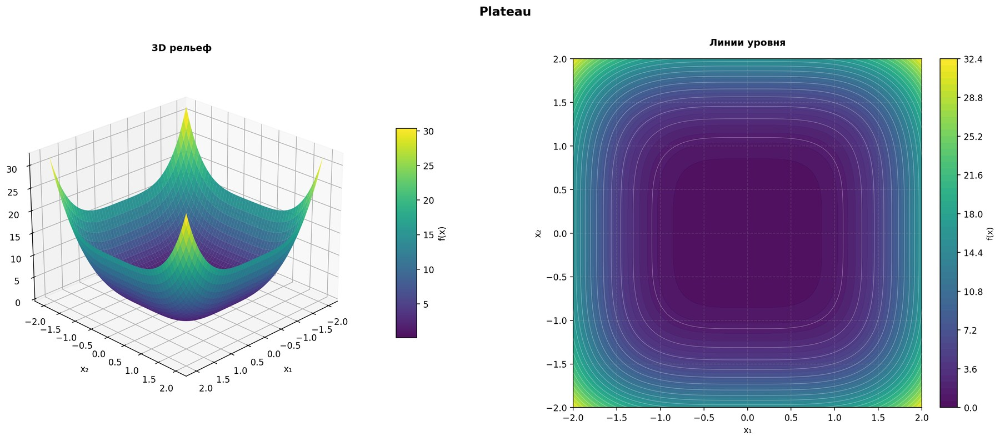
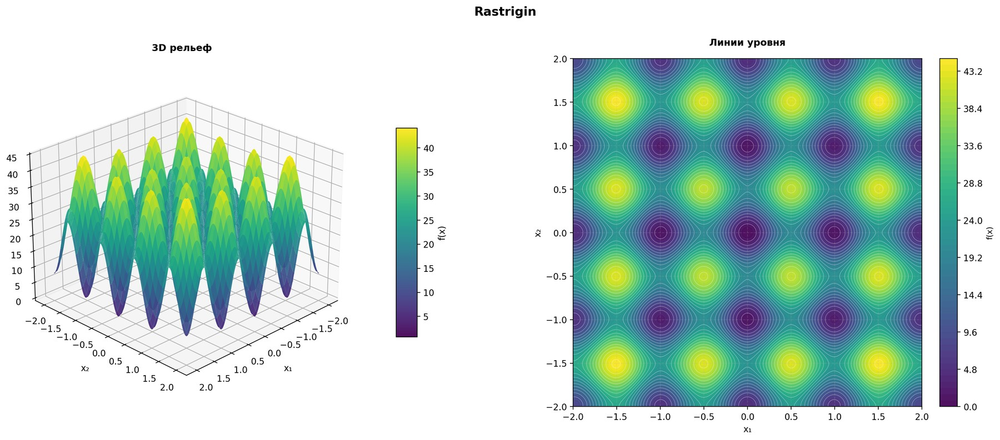
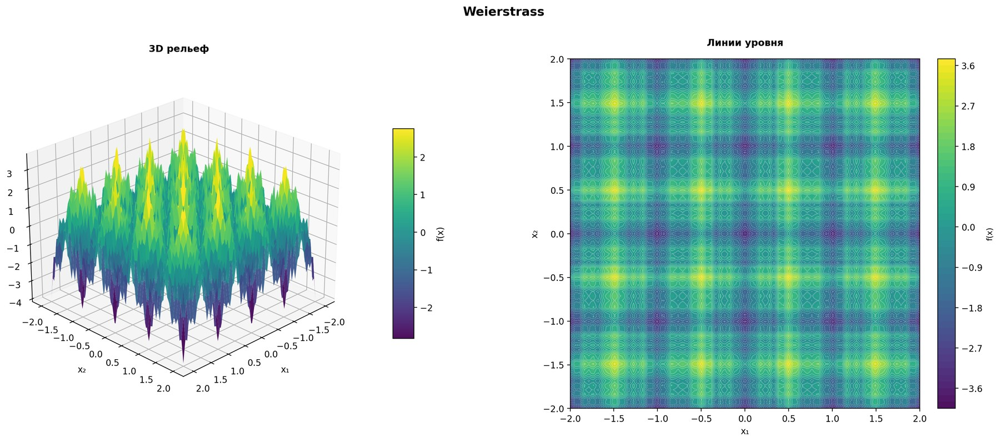

In [ ]:
# функции Плато, Расстригина и Вейерштрасса

Сравнивать будем 2 градиентных спуска - один с линейным поиском по условию Армихо, второй с экспоненциально убывающим шагом, реализованный ранее.

In [ ]:
# Градиентный спуск с линейным поиском по условию Армихо

# Анализ функции Плато
Хоть выглядит она довольно просто, поведение у неё очень коварное. По графикам можно видеть, что в начале длина шага у обоих алгоритмов очень большая, но по приближении к центру, шаг резко становится очень маленьким и алгоритм затухает, не до конца приблизившись к минимуму. Градиент этой функции вблизи точки минимума очень мал и почти равен 0, поэтому шаг резко затухает. Это пример функции, когда глобальный минимум 1, но достичь его градиентным спуском очень тяжело из-за очень малого значения градиента в окретности минимума. Условие остановки у функций одинаковое, но несмотря на это, методу с линейным поиском по условию Армихо нужно сильно меньше итераций, чем экспоненциальному. Здесь первый метод выигрывает по количеству запусков, но не по точности.


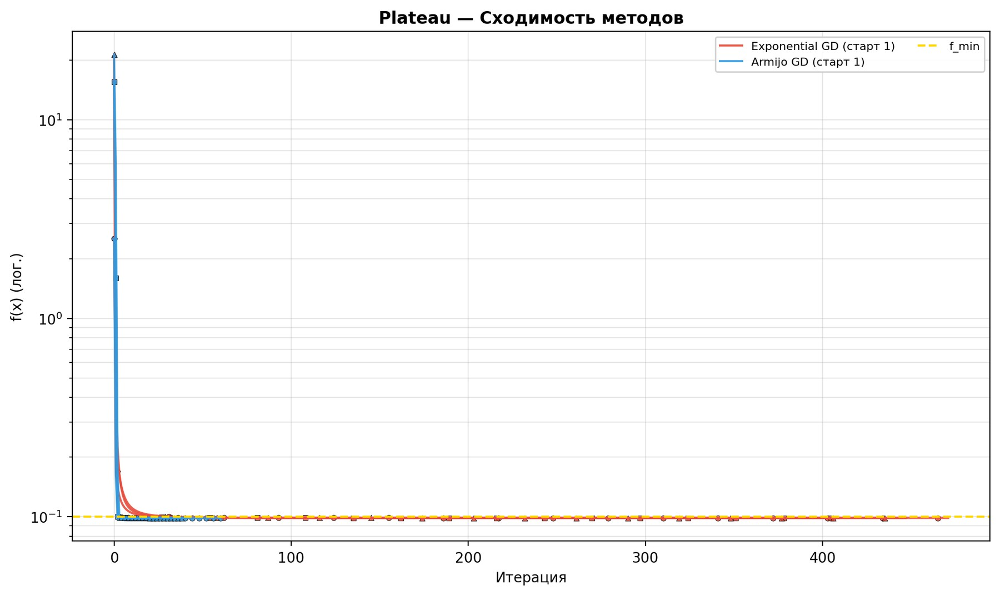
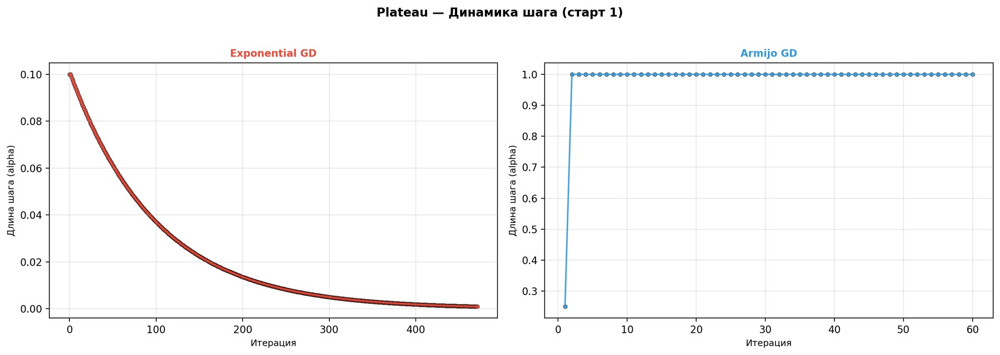
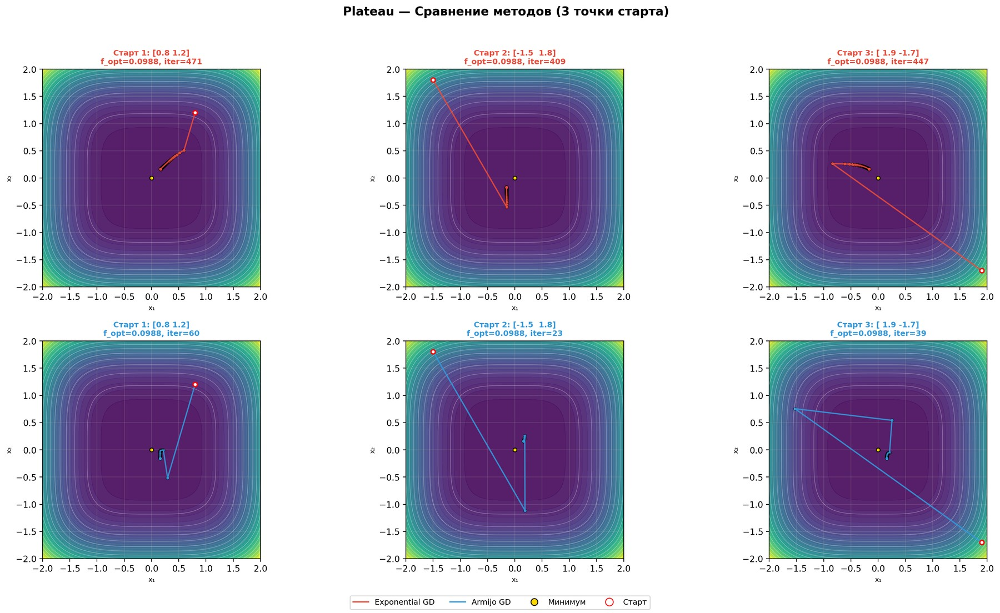

# Анализ функции Расстригина
Эта функция имеет уже очень много локальных минимумов, в которые легко провалиться и не выбраться оттуда. Хоть глобальный минимум и находится в (0,0), сильная осцилляция создаёт ямы, которые интерпретируются алгоритмом как глобальный минимум и они там застревают. Тут, при запуске экспоненциального метода, уже происходит какая-то каша, которая первые 250 итераций вообще не имеет визуального эффекта схождения к какой-то точке, это потому что шаг меняется медленно и не зависит от окружающей геометрии, вследствие он скачет довольно рандомно, тут у функции довольно резкие склоны в районе локальных экстремумов, поэтому такой большой разброс в шаге. Здесь опять выигрывает поиск с условием Армихо, он хоть и тоже приходит в какой-то локальный минимум и очень зависит от выбора точки, опять очень быстро затухает и предсказуем уже после 10 шагов.

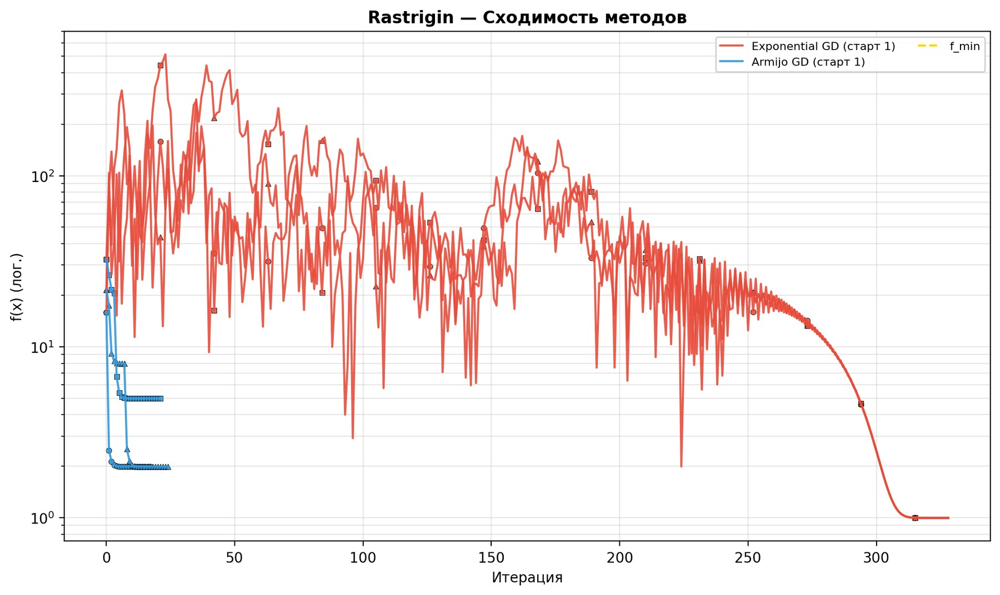
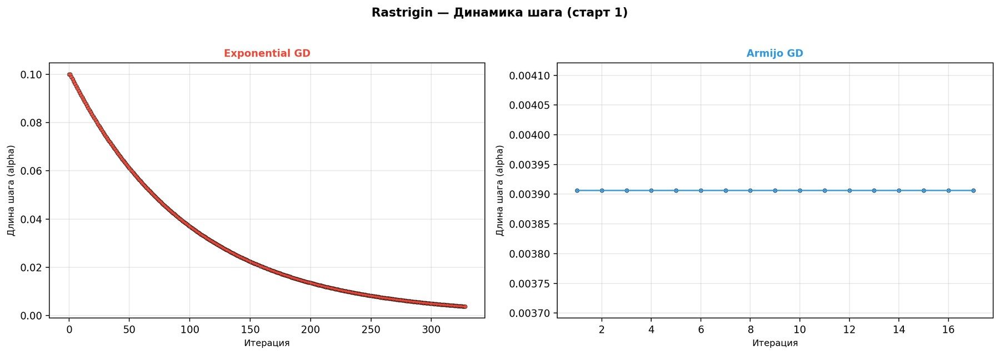
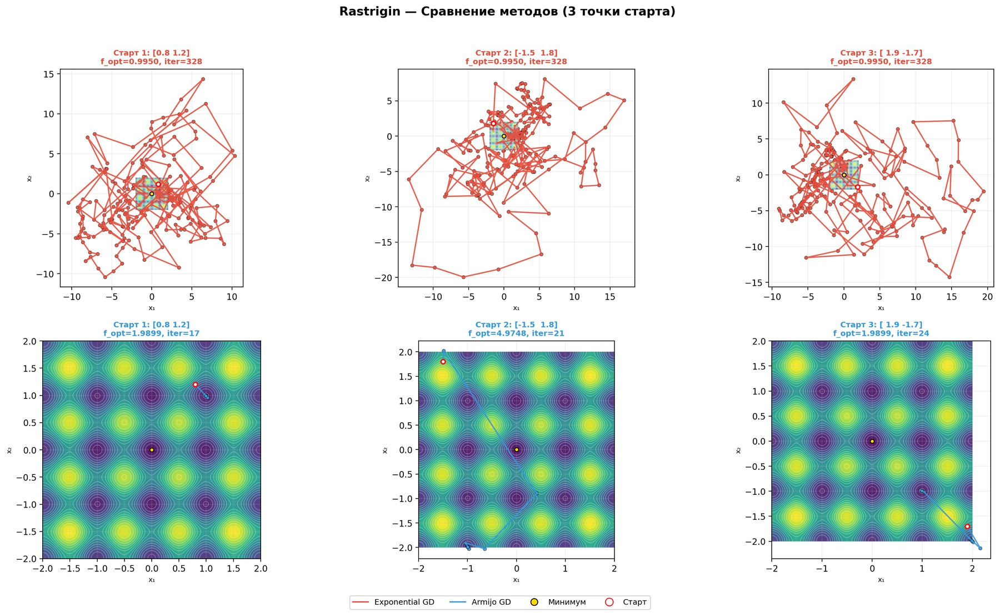

# Анализ функции Вейерштрасса
Это финальный босс отчёта. Функция Вейерштрасса в пределе вообще нигде не дифференцируема и очень резкая, её производная не существует. Для идеальной функции Вейерштрасса, экспоненциальный метод никогды бы не сошёлся, ни при каком запуске из какой-либо точки, но здесь, как видно на графике, так и происходит, колебания между значениями, различающимися в 1000 раз за соседние итерации показывают, что экспоненциальный метод здесь абсолютно неприменим и выдаёт случайный результат, на графике можно видеть, как из-за очень резких склонов функции практически в каждой точке, график пути экспоненциального метода случайно мечется по всей плоскости и это никак не зависит от выбора точки. Второй метод, осуществляющий линейный поиск, тоже за первые несколько итераций колеблется не очень понятно как и притягивается к ближайшему локальноу минимуму, однако переходя к функции Вейерштрасса, легко видеть, что и этот метод будет выдавать случайное блуждание, без гарантии какой-либо сходимости.

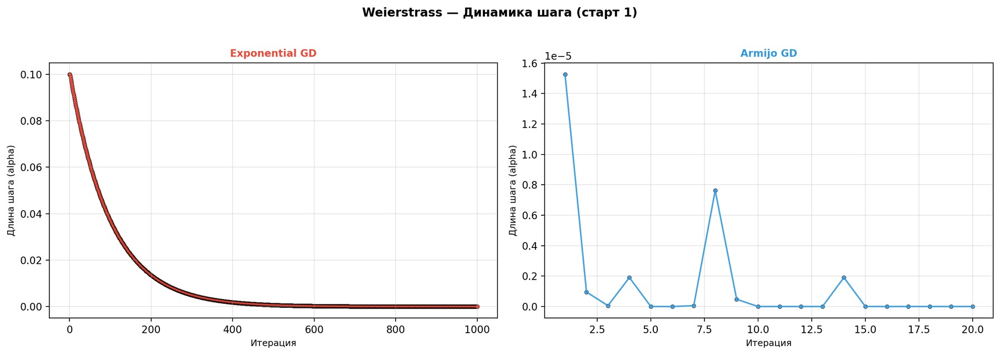
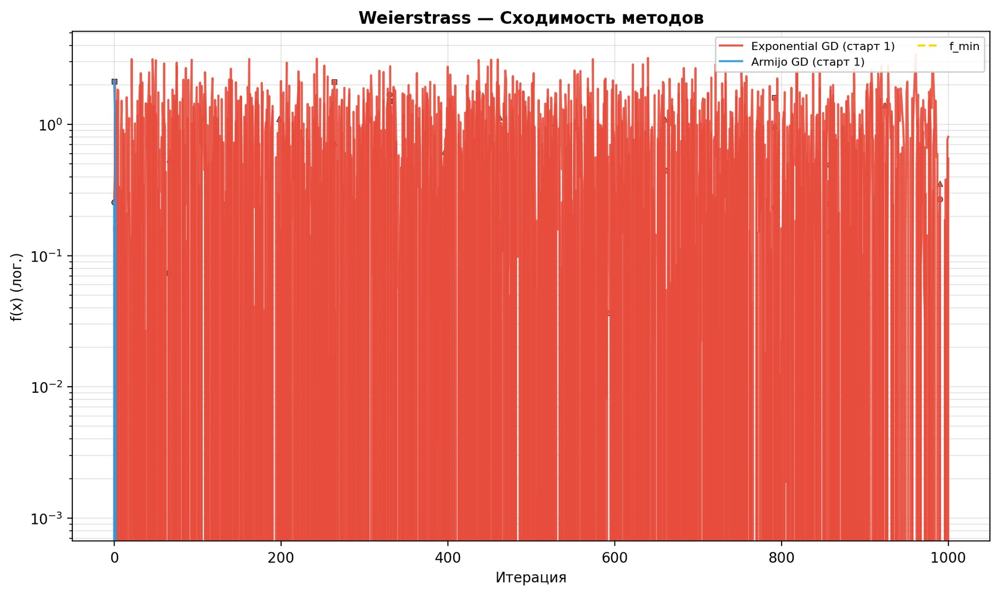
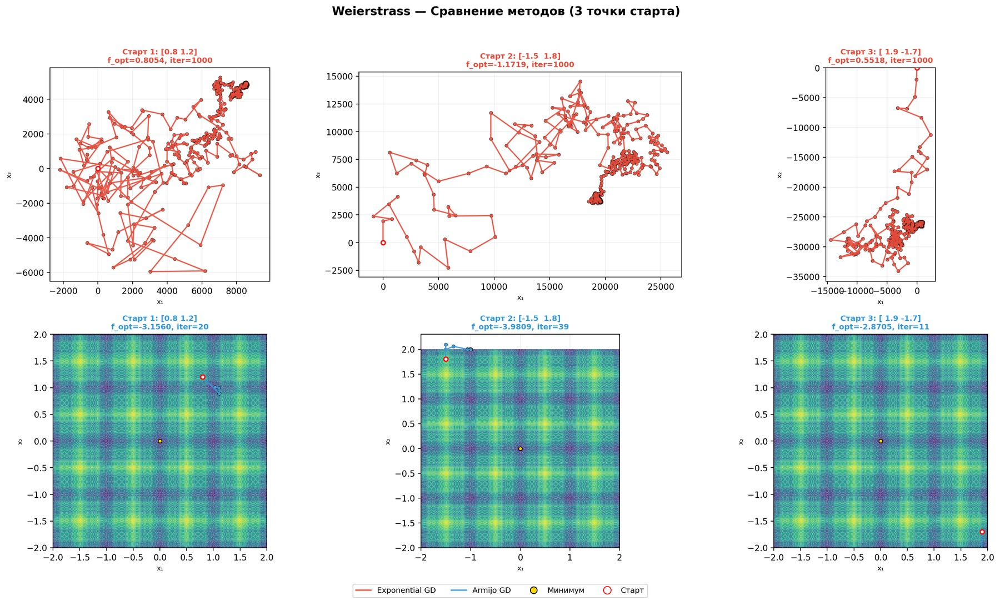

# Вывод

По итогам исследования всех методов можно сказать, что метод с линейным поиском по условию Армихо превзошёл все остальные методы и на функциях со сложным поведением получил результат намного точнее, чем остальные, применяя меньше количество итераций, хоть она и тратит больше вычислений, из-за линейного поиска.

# Другое

### Интересный факт 1, (другой крайний случай) существуют поверхности, на которых запуск градиентного спуска почти везде выдаст эту же точку в качестве минимума, хотя такая поверхность не является гиперплоскостью. 

## Пример
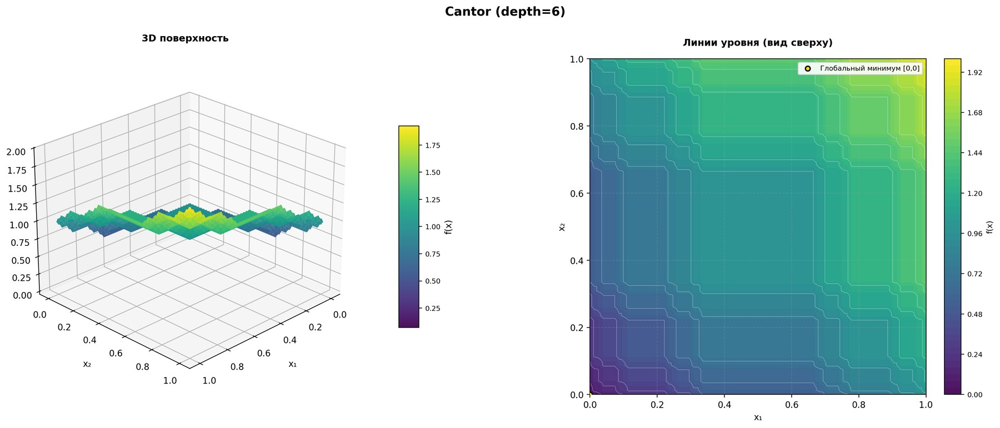
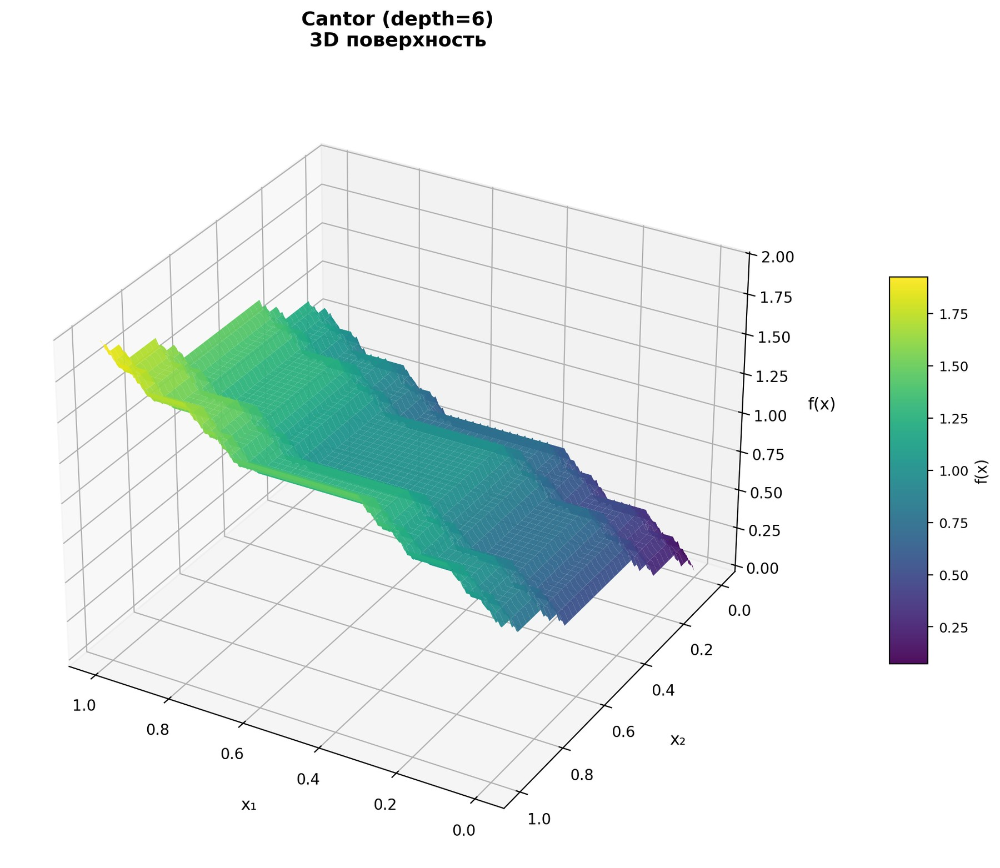
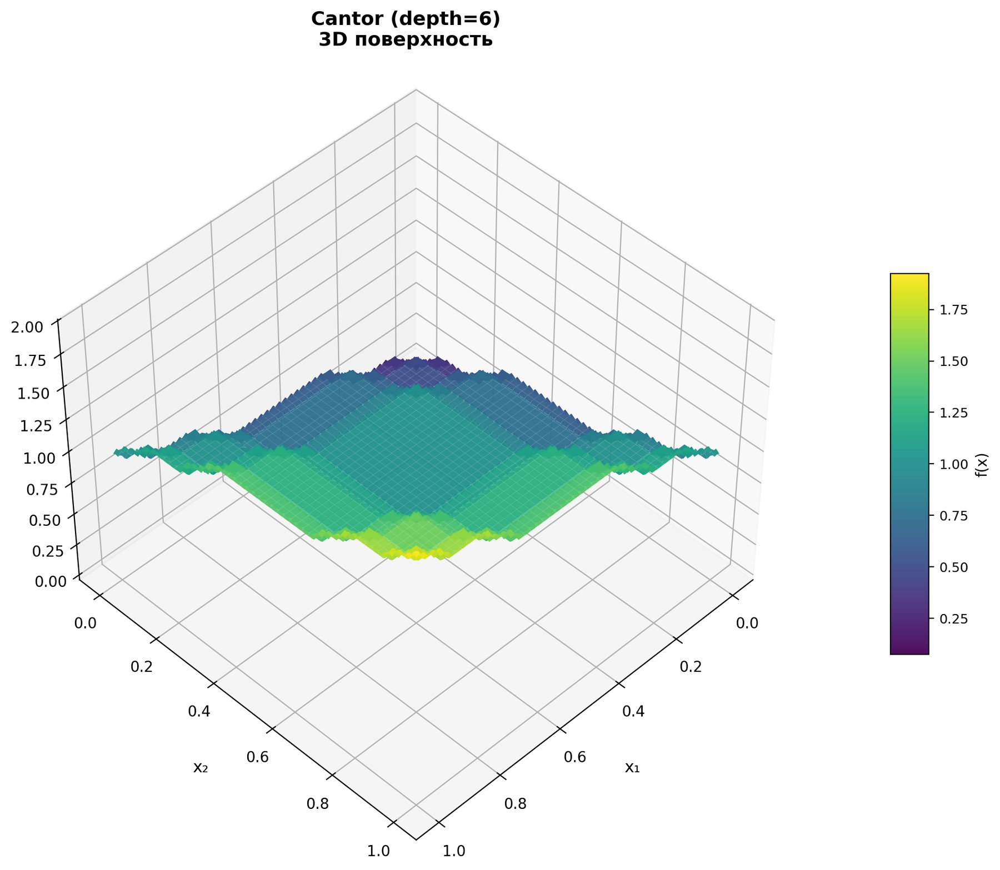
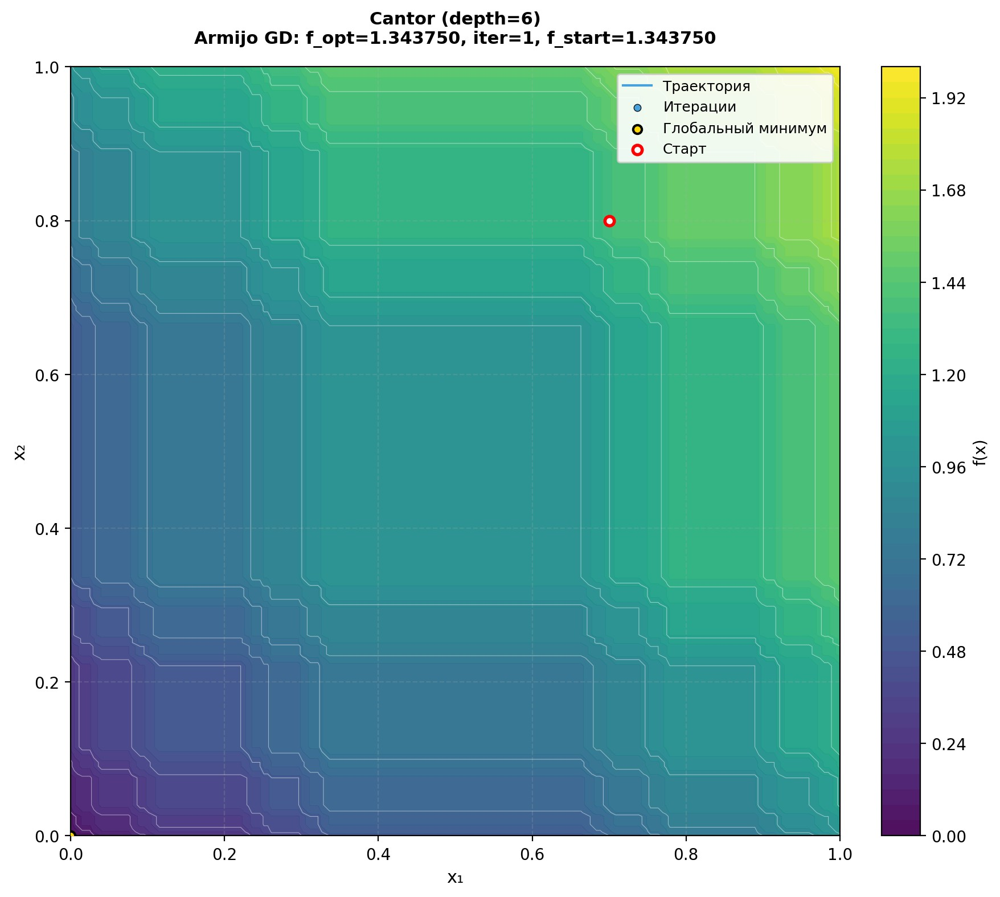
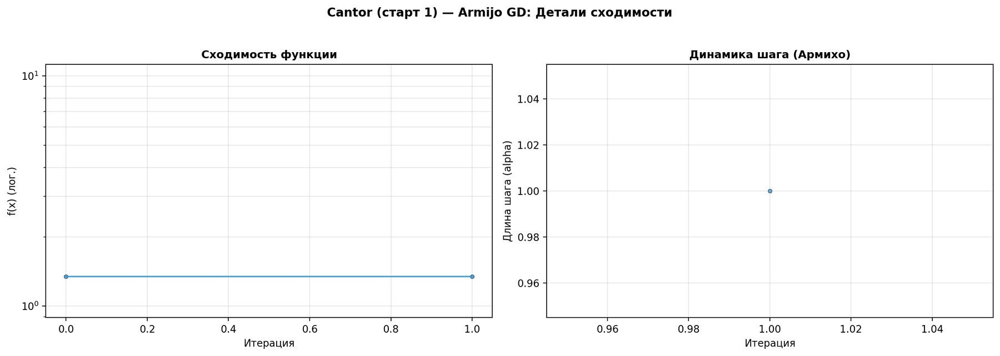
